In [32]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud

In [ ]:
# from langdetect import detect, DetectorFactory
# import pandas as pd
# 
# # Load and preprocess data
# text_file = r"Detail_99_CleanData_0625.csv"
# df = pd.read_csv(text_file)
# df = df[["GPTs_ID", "GPTs_Name", "Description"]]
# 
# # Function to detect primary language of a sentence
# def detect_primary_language(sentence):
#     try:
#         # Initialize DetectorFactory to increase reliability
#         DetectorFactory.seed = 0
#         # Skip empty or very short texts
#         if len(sentence.strip()) < 3:  # Adjust the threshold as needed
#             return None
#         # Detect language of the sentence
#         lang = detect(sentence)
#         return lang
#     except Exception as e:
#         print(f"Error detecting language: {sentence}")
#         return None
# 
# # Create a new column to store primary language
# df['Primary_Language'] = None
# 
# # Iterate over each row and apply the language detection function
# for index, row in df.iterrows():
#     if pd.notna(row['Description']):
#         df.at[index, 'Primary_Language'] = detect_primary_language(row['Description'])
# 
# # Display the DataFrame with primary language identified for each sentence
# print(df[['Description', 'Primary_Language']])


In [40]:
# Load clustered data from CSV
result_folder = r"E:\GPT\code_7"
input_file = result_folder + r'\sbert_similarity_results_allcat_with_cluster.csv'
df = pd.read_csv(input_file)
df.columns

Index(['GPTs_ID', 'GPTs_Name', 'Description', 'Rating', 'Number of Ratings',
       'Conversions', 'Author URL', 'Author', 'Features', 'Conversion_start',
       'num_rate', 'Website', 'Linkedin', 'Github', 'Twitter', 'num_of_links',
       'map_Category', 'Primary_Language', 'Description_cleaned',
       'Features_cleaned', 'Conversion_start_cleaned', 'Description_Cluster',
       'Features_Cluster', 'Conversion_Cluster'],
      dtype='object')

Silhouette Score: 0.009018278382213763


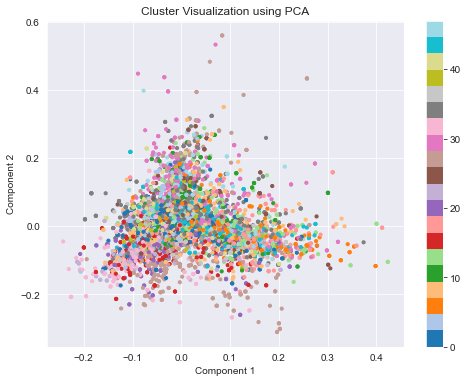

In [34]:
# Extract text data and cluster labels
texts = df['Description'].tolist()
labels = df['Description_Cluster'].tolist()

# Visualize clustering using PCA or t-SNE
def visualize_clusters(embeddings, labels, method='PCA'):
    if method == 'PCA':
        reducer = PCA(n_components=2, random_state=42)
    elif method == 't-SNE':
        reducer = TSNE(n_components=2, random_state=42)
    else:
        raise ValueError("Unsupported dimensionality reduction method. Choose 'PCA' or 't-SNE'.")
    
    embeddings_2d = reducer.fit_transform(embeddings)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=labels, cmap='tab20', s=10)
    plt.title(f'Cluster Visualization using {method}')
    plt.colorbar()
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.show()

# Compute TF-IDF features for cluster profiles
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(texts)

# Assess clustering quality using silhouette score
silhouette_avg = silhouette_score(X, labels)
print(f"Silhouette Score: {silhouette_avg}")

# Visualize clusters using PCA
visualize_clusters(X.toarray(), labels, method='PCA')


Number of None values in 'Features': 0
Number of None values in 'Features_Cluster': 0
Silhouette Score: 0.2554717561541349


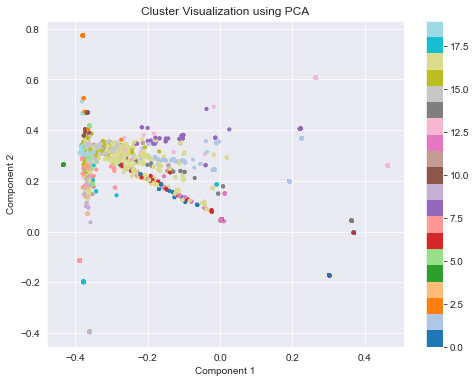

In [35]:
# Extract text data and cluster labels
texts = df['Features'].tolist()
labels = df['Features_Cluster'].tolist()

# Count None (NaN) values in each column
none_count = df['Features'].isna().sum()
cluster_none_count = df['Features_Cluster'].isna().sum()
print(f"Number of None values in 'Features': {none_count}")
print(f"Number of None values in 'Features_Cluster': {cluster_none_count}")

# Visualize clustering using PCA or t-SNE
def visualize_clusters(embeddings, labels, method='PCA'):
    if method == 'PCA':
        reducer = PCA(n_components=2, random_state=42)
    elif method == 't-SNE':
        reducer = TSNE(n_components=2, random_state=42)
    else:
        raise ValueError("Unsupported dimensionality reduction method. Choose 'PCA' or 't-SNE'.")
    
    embeddings_2d = reducer.fit_transform(embeddings)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=labels, cmap='tab20', s=10)
    plt.title(f'Cluster Visualization using {method}')
    plt.colorbar()
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.show()

# Compute TF-IDF features for cluster profiles
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(texts)

# Assess clustering quality using silhouette score
silhouette_avg = silhouette_score(X, labels)
print(f"Silhouette Score: {silhouette_avg}")

# Visualize clusters using PCA
visualize_clusters(X.toarray(), labels, method='PCA')


Number of None values in 'Conversion_start': 620
Number of None values in 'Conversion_Cluster': 0
Silhouette Score: 0.00952448786328486


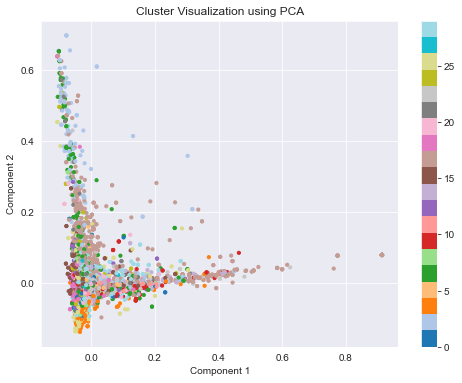

In [36]:
# Load clustered data from CSV
result_folder = r"E:\GPT\code_3"
input_file = result_folder + r'\sbert_similarity_results_allcat_with_language_with_cluster.csv'
df = pd.read_csv(input_file)

# Count None (NaN) values in each column
conversion_start_none_count = df['Conversion_start'].isna().sum()
conversion_cluster_none_count = df['Conversion_Cluster'].isna().sum()
print(f"Number of None values in 'Conversion_start': {conversion_start_none_count}")
print(f"Number of None values in 'Conversion_Cluster': {conversion_cluster_none_count}")
df_cleaned = df.dropna(subset=['Conversion_start'])
# Extract text data and cluster labels
texts = df_cleaned['Conversion_start'].tolist()
labels = df_cleaned['Conversion_Cluster'].tolist()

# Visualize clustering using PCA or t-SNE
def visualize_clusters(embeddings, labels, method='PCA'):
    if method == 'PCA':
        reducer = PCA(n_components=2, random_state=42)
    elif method == 't-SNE':
        reducer = TSNE(n_components=2, random_state=42)
    else:
        raise ValueError("Unsupported dimensionality reduction method. Choose 'PCA' or 't-SNE'.")

    embeddings_2d = reducer.fit_transform(embeddings)

    plt.figure(figsize=(8, 6))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=labels, cmap='tab20', s=10)
    plt.title(f'Cluster Visualization using {method}')
    plt.colorbar()
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.show()

# Compute TF-IDF features for cluster profiles
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(texts)

# Assess clustering quality using silhouette score
silhouette_avg = silhouette_score(X, labels)
print(f"Silhouette Score: {silhouette_avg}")

# Visualize clusters using PCA
visualize_clusters(X.toarray(), labels, method='PCA')


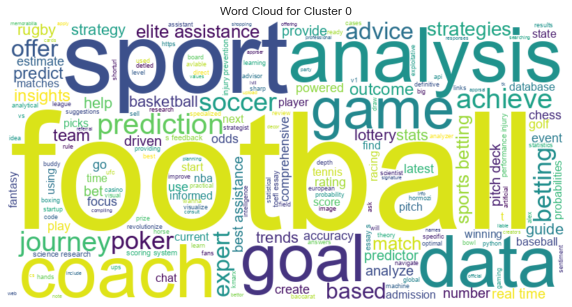

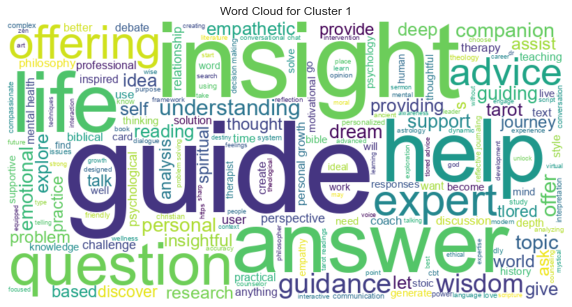

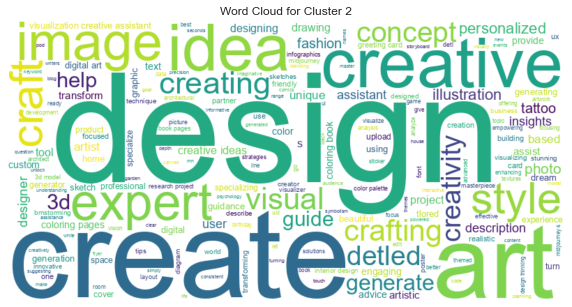

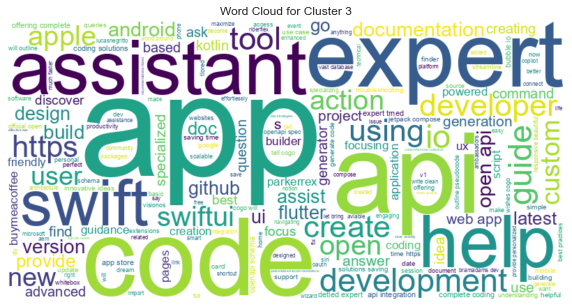

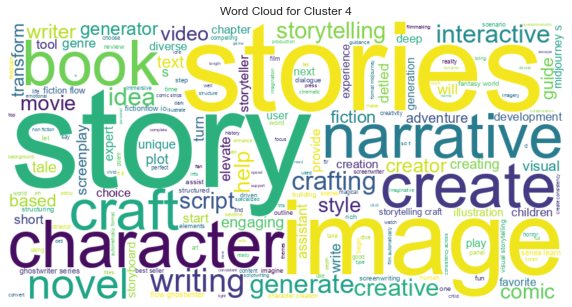

...

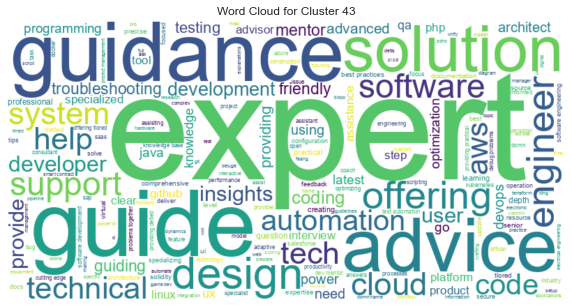

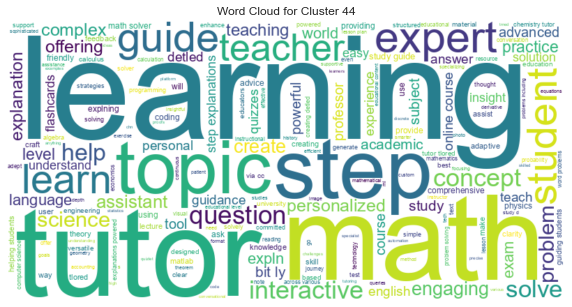

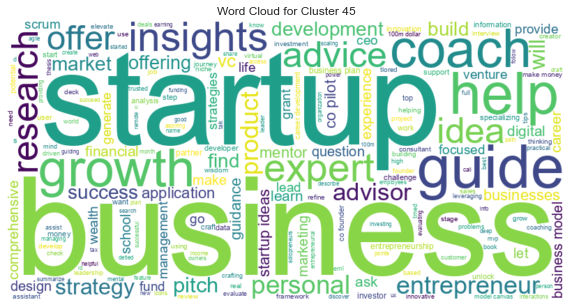

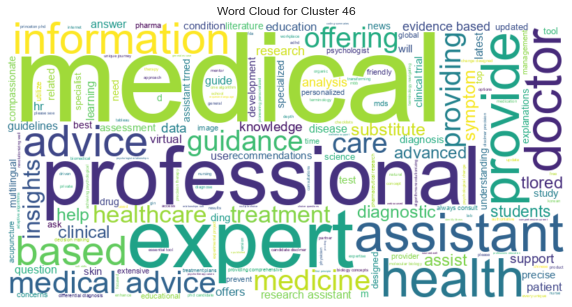

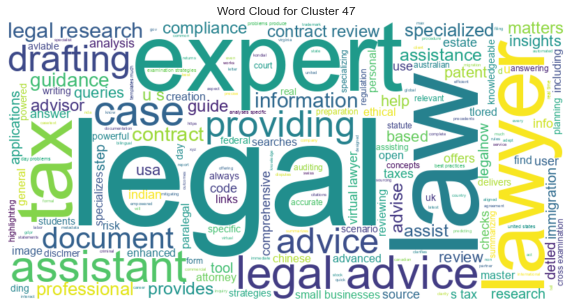

In [41]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def generate_wordclouds(texts, labels):
    unique_labels = set(labels)
    for label in unique_labels:
        cluster_texts = [texts[i] for i, l in enumerate(labels) if l == label]
        cluster_text = ' '.join(cluster_texts)
        
        # Use default font provided by matplotlib
        wordcloud = WordCloud(font_path='arial.ttf', background_color='white', width=800, height=400).generate(cluster_text)
        # wordcloud = WordCloud(background_color='white', width=800, height=400, font_path='path/to/your/font.ttf').generate(cluster_text)

        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for Cluster {label}')
        plt.axis('off')
        plt.show()
# Example usage with default font
texts = df['Description_cleaned'].tolist()
labels = df['Description_Cluster'].tolist()
generate_wordclouds(texts, labels)


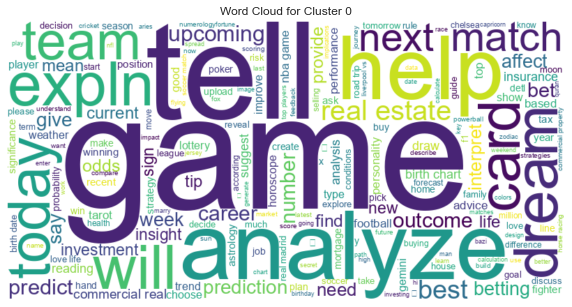

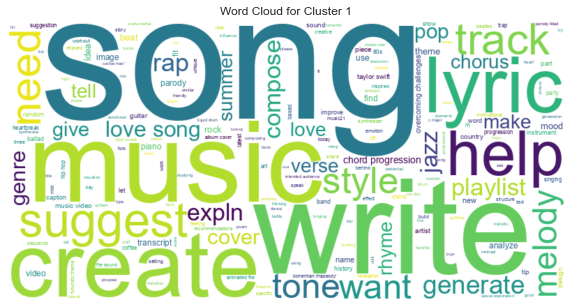

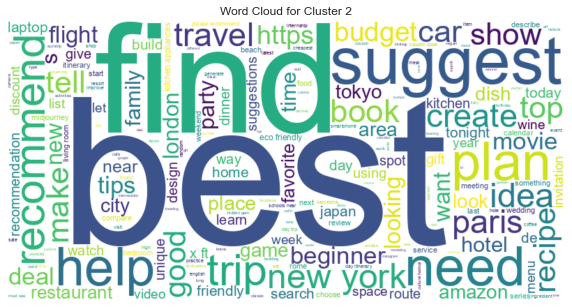

TypeError: sequence item 0: expected str instance, float found

In [45]:
# Example usage with default font
texts = df['Conversion_start_cleaned'].tolist()
labels = df['Conversion_Cluster'].tolist()
generate_wordclouds(texts, labels)
# need to remove "Conversion Starters", "AI", "GPT", "Prompt", "Starters", "ChatGPT"

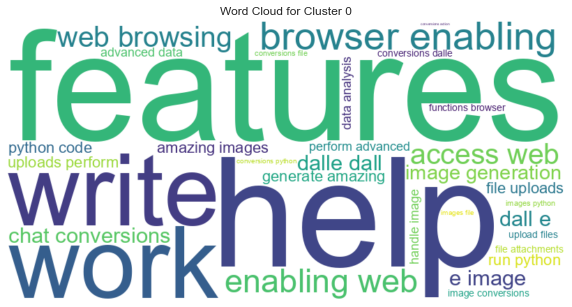

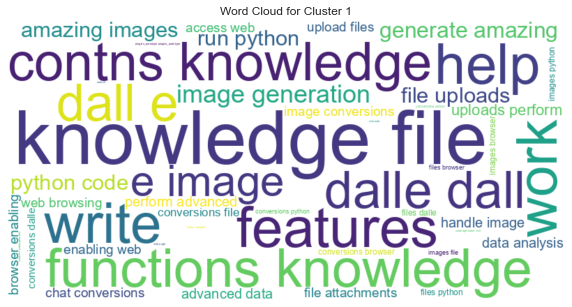

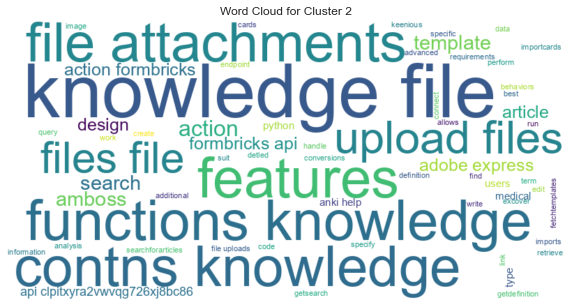

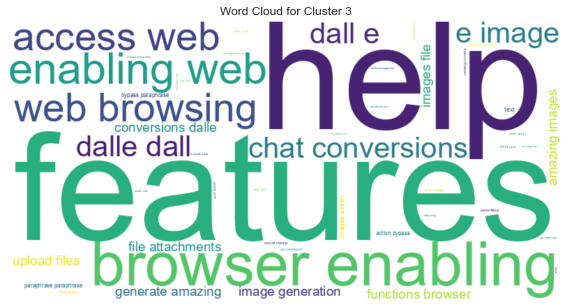

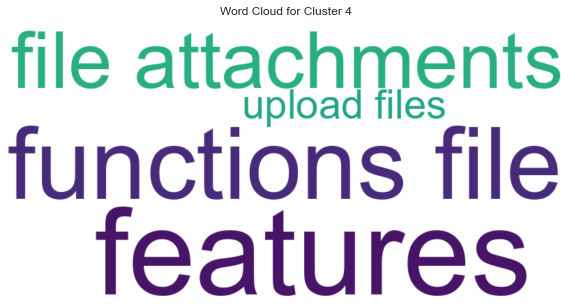

...

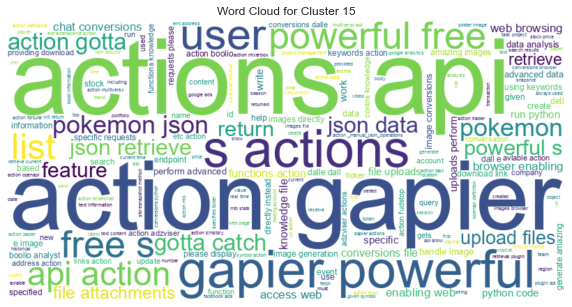

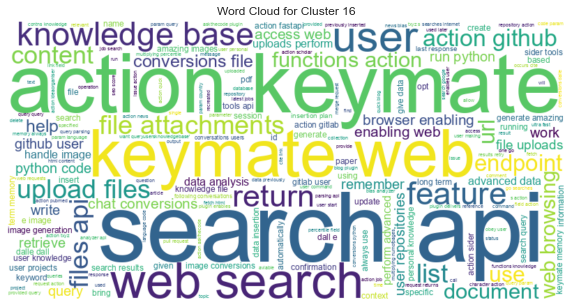

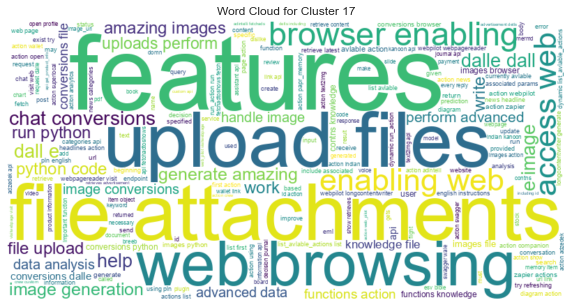

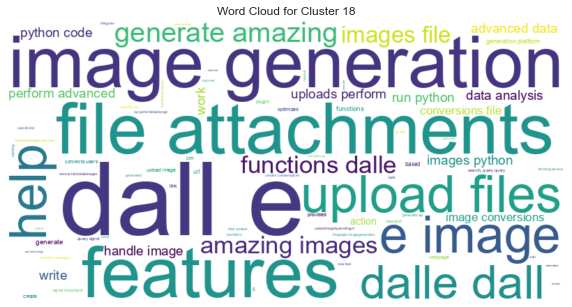

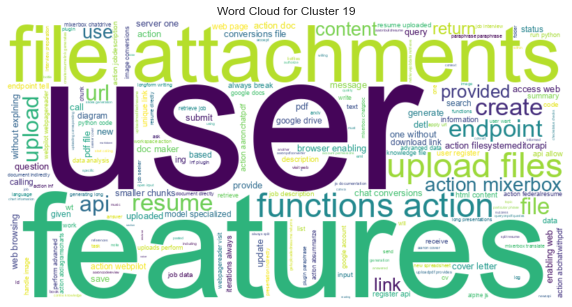

In [47]:
# Example usage with default font
texts = df['Features_cleaned'].tolist()
labels = df['Features_Cluster'].tolist()
generate_wordclouds(texts, labels)